# Setup the Environment
We are going to use YOLOv5 model for training.
so lets clone and install the YOLO from github repo

In [ ]:
#New Start Here
from google.colab import drive
drive.mount('/content/gdrive/')
%cd /content/gdrive/MyDrive/Python_learning/face_mask/
!git clone https://github.com/ultralytics/yolov5


Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).
/content/gdrive/MyDrive/Python_learning/face_mask
Cloning into 'yolov5'...
remote: Enumerating objects: 14887, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 14887 (delta 0), reused 3 (delta 0), pack-reused 14882
Receiving objects: 100% (14887/14887), 13.92 MiB | 6.68 MiB/s, done.
Resolving deltas: 100% (10239/10239), done.
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [1]:
#Restart Here
from google.colab import drive
drive.mount('/content/gdrive/')


Mounted at /content/gdrive/


In [2]:
%cd /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5/
!pip install -qr requirements.txt

/content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.9 MB/s eta 0:00:00


In [3]:
# Import required libraries
import pandas as pd
import numpy as np
import os
import glob
from datetime import datetime
import xml.etree.ElementTree as ET 
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Read and Handle Annotations
Read the data from .xml files
<br>
Extract filename and dimensions of the bouding boxes
<br>
and import that data into a pandas DataFrame

In [ ]:
annotations_path = "/content/gdrive/Shareddrives/Face_mask_dataset/Face_mask_dataset/detection/labels"
images_path = "/content/gdrive/Shareddrives/Face_mask_dataset/Face_mask_dataset/detection/images"

In [ ]:
dataset = {
            "file":[],
            "name":[],    
            "width":[],
            "height":[],
            "xmin":[],
            "ymin":[],   
            "xmax":[],
            "ymax":[],
           }

for anno in glob.glob(annotations_path+"/*.xml"):
    tree = ET.parse(anno)
    
    for elem in tree.iter():
        if 'size' in elem.tag:
            for attr in list(elem):
                if 'width' in attr.tag: 
                    width = int(round(float(attr.text)))
                if 'height' in attr.tag:
                    height = int(round(float(attr.text)))    

        if 'object' in elem.tag:
            for attr in list(elem):
                
                if 'name' in attr.tag:
                    name = attr.text                 
                    dataset['name']+=[name]
                    dataset['width']+=[width]
                    dataset['height']+=[height] 
                    dataset['file']+=[anno.split('/')[-1][0:-4]] 
                            
                if 'bndbox' in attr.tag:
                    for dim in list(attr):
                        if 'xmin' in dim.tag:
                            xmin = int(round(float(dim.text)))
                            dataset['xmin']+=[xmin]
                        if 'ymin' in dim.tag:
                            ymin = int(round(float(dim.text)))
                            dataset['ymin']+=[ymin]                                
                        if 'xmax' in dim.tag:
                            xmax = int(round(float(dim.text)))
                            dataset['xmax']+=[xmax]                                
                        if 'ymax' in dim.tag:
                            ymax = int(round(float(dim.text)))
                            dataset['ymax']+=[ymax]

In [ ]:
df=pd.DataFrame(dataset)
df.head()

,file,name,width,height,xmin,ymin,xmax,ymax
0,PXL_20221215_123656743,mask,1024,1024,249,248,722,869
1,IMG_5570_png,face,1024,1024,200,50,869,597
2,IMG_8182_png,mask,1024,1024,400,144,718,460
3,IMG_9978_png,mask,1024,1024,436,335,555,450
4,IMG_9978_png,mask,1024,1024,665,448,847,637


In [ ]:
name_dict = {
    'mask': 0,
    'face': 1 
}

df['class'] = df['name'].map(name_dict)

In [ ]:
np.sort(df.name.unique())

array(['face', 'mask'], dtype=object)

# Train Test Split
Split the dataset into training testing and validation set
<br>
separate the data in different folder inside the Yolo directory
<br>
and Normalize data

In [ ]:
fileNames = [*os.listdir(images_path)]
print('There are {} images in the dataset'.format(len(fileNames)))

There are 929 images in the dataset


In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(fileNames, test_size=0.1, random_state=7777)
test, val = train_test_split(test, test_size=0.7, random_state=7777)
print("Length of Train =",len(train))
print("="*30)
print("Length of Valid =",len(val))
print("="*30)
print("Length of test =", len(test))

Length of Train = 836
Length of Valid = 66
Length of test = 27


In [ ]:
# create separate train test and validation dir inside yolo/data/
# If already create then skip
%cd /content/gdrive/MyDrive/Python_learning/face_mask/
os.mkdir('./yolov5/data/train')
os.mkdir('./yolov5/data/val')
os.mkdir('./yolov5/data/test')
os.mkdir('./yolov5/data/train/images')
os.mkdir('./yolov5/data/train/labels')
os.mkdir('./yolov5/data/test/images')
os.mkdir('./yolov5/data/test/labels')
os.mkdir('./yolov5/data/val/images')
os.mkdir('./yolov5/data/val/labels')

/content/gdrive/MyDrive/Python_learning/face_mask


FileExistsError: ignored

In [ ]:
# cd to your source path
%cd /content/gdrive/MyDrive/Python_learning/face_mask/
input_data = '/content/gdrive/Shareddrives/Face_mask_dataset/Face_mask_dataset/detection/'
output_data = '/content/gdrive/Shareddrives/Face_Mask_Code/face_mask/'
from PIL import Image

def copyImages(imageList, folder_Name):
    for image in imageList:
        img = Image.open(input_data+"/images/"+image)
        img1 = img.resize((1024, 1024))
        _ = img1.save(output_data+"/yolov5/data/"+folder_Name+"/images/"+image)

copyImages(train, "train")
copyImages(val, "val")
copyImages(test, "test")
df.head()

/content/gdrive/MyDrive/Python_learning/face_mask


,file,name,width,height,xmin,ymin,xmax,ymax,class
0,PXL_20221215_123656743,mask,1024,1024,249,248,722,869,0
1,IMG_5570_png,face,1024,1024,200,50,869,597,1
2,IMG_8182_png,mask,1024,1024,400,144,718,460,0
3,IMG_9978_png,mask,1024,1024,436,335,555,450,0
4,IMG_9978_png,mask,1024,1024,665,448,847,637,0


In [ ]:
df['xmax'] = (1024/df['width'])*df['xmax']
df['ymax'] = (1024/df['height'])*df['ymax']
df['xmin'] = (1024/df['width'])*df['xmin']
df['ymin'] = (1024/df['height'])*df['ymin']
df[['xmax', 'ymax', 'xmin', 'ymin']] = df[['xmax', 'ymax', 'xmin', 'ymin']].astype('int64')

In [ ]:
df['x_center'] = (df['xmax']+df['xmin'])/(2*1024)
df['y_center'] = (df['ymax']+df['ymin'])/(2*1024)
df['box_height'] = (df['xmax']-df['xmin'])/(1024)
df['box_width'] = (df['ymax']-df['ymin'])/(1024)
df.head()
df = df.astype('string')

In [ ]:
def create_labels(image_list, data_name):
    fileNames = [x.split(".")[0] for x in image_list]

    for name in fileNames:
        data = df[df.file==name]
        box_list = []
        
        for index in range(len(data)):
            row = data.iloc[index]
            box_list.append(row['class']+" "+row["x_center"]+" "+row["y_center"]\
                        +" "+row["box_height"]+" "+row["box_width"])
            
        text = "\n".join(box_list)
        with open(output_data+"/yolov5/data/"+data_name+"/labels/"+name+".txt", "w") as file:
            file.write(text)


create_labels(train, "train")
create_labels(val, "val")
create_labels(test, "test")

# Configure the Model

In [4]:
# to display images
# go to YOLO directory
%cd /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/
from IPython.display import Image, clear_output
import torch
from yolov5 import utils
# display = utils.notebook_init()

/content/gdrive/Shareddrives/Face_Mask_Code/face_mask


In [5]:
# configure .yaml file to guide the model for training
%cd /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5/
custom_yaml = """train: data/train/images
val: data/train/images

nc: 2
names: ['mask','face']"""

with open("data/data.yaml", 'w') as file:
    file.write(custom_yaml)

%cat data/data.yaml

/content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5
train: data/train/images
val: data/train/images

nc: 2
names: ['mask','face']

In [6]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [7]:
%%writetemplate models/custom_yolov5s.yaml

# parameters
nc: 2  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
    - [10,13, 16,30, 33,23]  # P3/8
    - [30,61, 62,45, 59,119]  # P4/16
    - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
    [[-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
    [[-1, 6], 1, Concat, [1]],  # cat backbone P4
    [-1, 3, BottleneckCSP, [512, False]],  # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
    [[-1, 4], 1, Concat, [1]],  # cat backbone P3
    [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]],  # cat head P4
    [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]],  # cat head P5
    [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
    ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
# we are going to using pre-trained weights from yolov5.pt model

start = datetime.now()
!python train.py --img 1024 --batch 16 --epochs 300 --data data/data.yaml --cfg models/custom_yolov5s.yaml --weights runs/train/yolov5s_results6/weights/best.pt --name yolov5s_results 
end = datetime.now()
print("Runtime =",end-start)

train: weights=runs/train/yolov5s_results6/weights/best.pt, cfg=models/custom_yolov5s.yaml, data=data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=1024, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 10 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v7.0-49-g3c1afd9 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_b

In [4]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

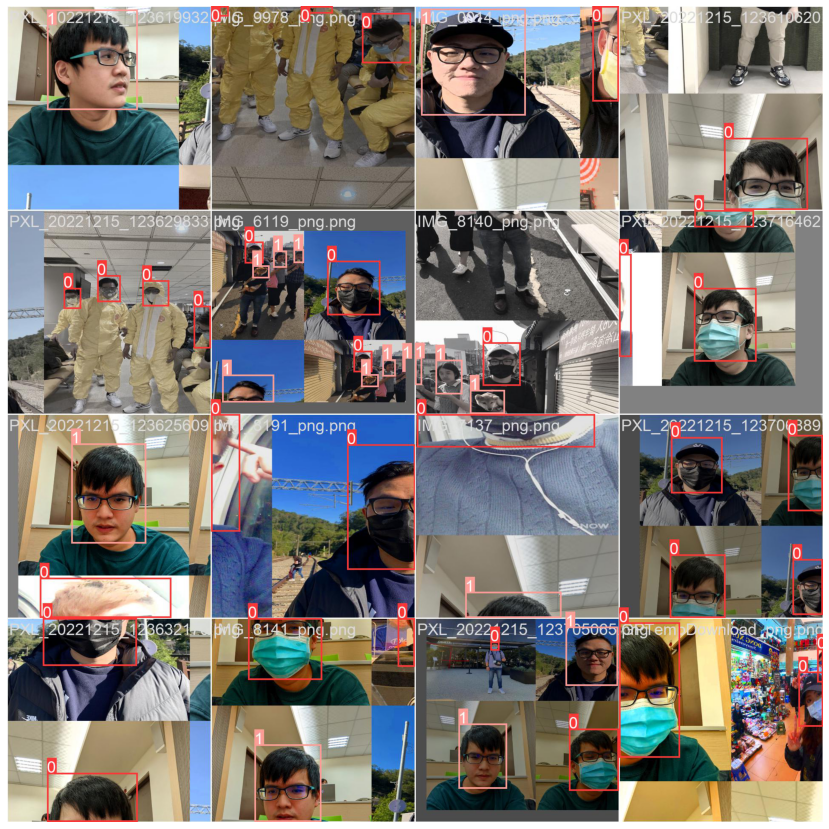

In [ ]:
# lets visualize the training results
img = plt.imread('runs/train/yolov5s_results/train_batch0.jpg')
plt.figure(figsize=(20,15))
plt.imshow(img)
plt.axis('off')
plt.show()

# Test the Model
lets test the model over test images we had separated before training

In [5]:
!python detect.py --img 1024 --source data/test/images/ --weight runs/train/yolov5s_results10/weights/last.pt --name expTestImage --conf 0.4

detect: weights=['runs/train/yolov5s_results10/weights/last.pt'], source=data/test/images/, data=data/coco128.yaml, imgsz=[1024, 1024], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=expTestImage, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-49-g3c1afd9 Python-3.8.16 torch-1.13.0+cu116 CPU

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
image 1/66 /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5/data/test/images/300 (2).png: 1024x1024 1 face, 1385.5ms
image 2/66 /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5/data/test/images/4754.png: 1024x1024 1 face, 1208.5ms
image 3/66 /content/gdrive/Shareddrives/Face_Mask_Code/face_mask/yolov5/data/test/images/6231.png:

results are saved inside run/detect/expTestImage dir <br>
let's check the results to see how our model performed

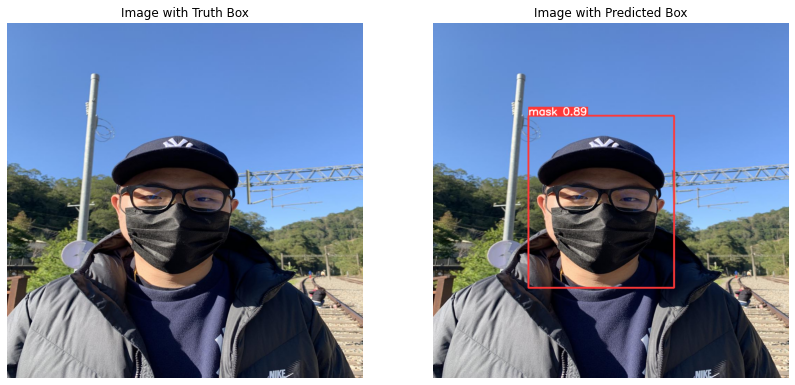

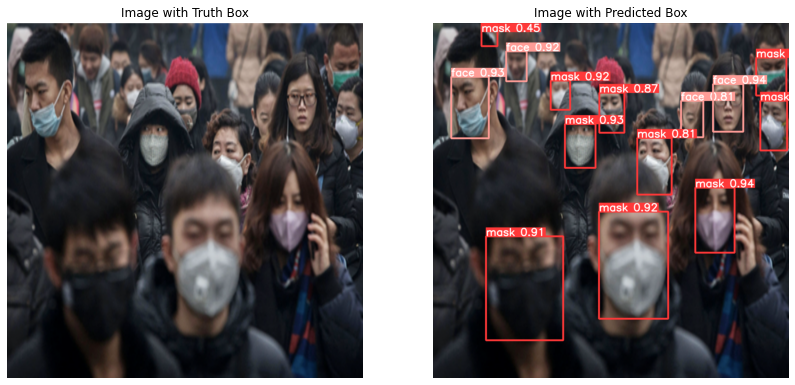

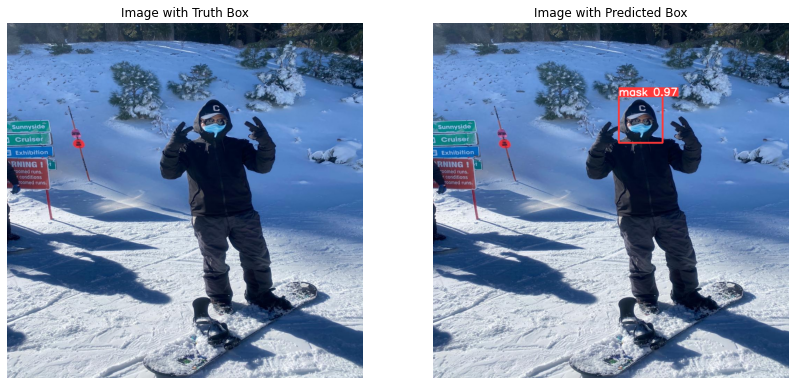

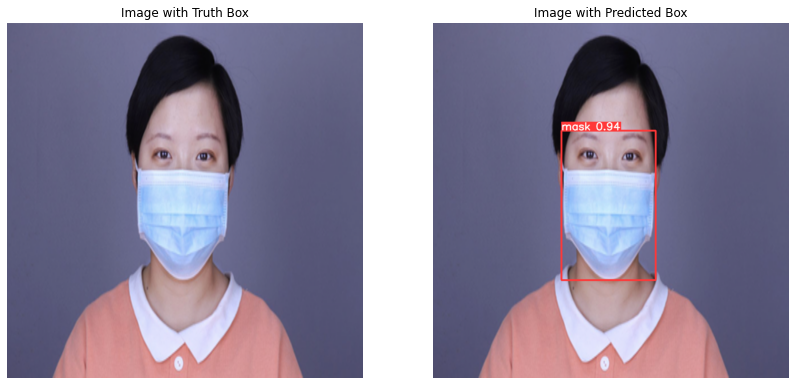

In [ ]:
color_dict = {
    'mask': (0, 255, 0),
    'face': (255, 0, 0) 
}

def show_image(img_id):
    df_image = df[df.file==img_id]
    df_image[['xmin', 'ymin', 'xmax', 'ymax']] = df_image[['xmin', 'ymin', 'xmax', 'ymax']].astype('int64')
    path = 'data/test/images/'+img_id #+'.png'
    img = plt.imread(path)

    imge = img.copy()

    for index in range(len(df_image)):
        row = df_image.iloc[index]
        cv2.rectangle(imge, 
                      (row['xmin'], row['ymin']),
                      (row['xmax'], row['ymax']),
                      color=color_dict[row['name']],
                      thickness=2)

    img_pred = plt.imread('runs/detect/expTestImage7/'+img_id)
    # ===================================
    plt.figure(figsize=(14,17))

    plt.subplot(1,2,1)
    plt.imshow(imge)
    plt.axis('off')
    plt.title('Image with Truth Box')

    plt.subplot(1,2,2)
    plt.imshow(img_pred)
    plt.axis('off')
    plt.title('Image with Predicted Box')



import os, random
show_image(random.choice(os.listdir("data/test/images/"))) 
show_image(random.choice(os.listdir("data/test/images/"))) 
show_image(random.choice(os.listdir("data/test/images/"))) 
show_image(random.choice(os.listdir("data/test/images/"))) 
 
plt.show()

# END